# Brazilian Houses for Rent

## Table of Contents

## 1) Data Preparation

<br/>
Loading all the modules that will be used:
<br/><br/>

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('whitegrid')

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

import warnings
warnings.filterwarnings(action='ignore', category=DeprecationWarning)
warnings.filterwarnings(action='ignore', category=FutureWarning)

In [3]:
df = pd.read_csv('../Data/houses_to_rent_v2.csv')

In [4]:
df.head()

,city,area,rooms,bathroom,parking spaces,floor,animal,furniture,hoa (R$),rent amount (R$),property tax (R$),fire insurance (R$),total (R$)
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973
2,Porto Alegre,80,1,1,1,6,acept,not furnished,1000,2800,0,41,3841
3,Porto Alegre,51,2,1,0,2,acept,not furnished,270,1112,22,17,1421
4,São Paulo,25,1,1,0,1,not acept,not furnished,0,800,25,11,836


<br/><br/>

Changing column names for the better.
<br/><br/>

In [5]:
df_clean = df.copy()
df_clean.columns = [col.replace('(R$)', '').strip().replace(' ', '_') for col in df_clean.columns]

In [6]:
df_clean.head()

,city,area,rooms,bathroom,parking_spaces,floor,animal,furniture,hoa,rent_amount,property_tax,fire_insurance,total
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973
2,Porto Alegre,80,1,1,1,6,acept,not furnished,1000,2800,0,41,3841
3,Porto Alegre,51,2,1,0,2,acept,not furnished,270,1112,22,17,1421
4,São Paulo,25,1,1,0,1,not acept,not furnished,0,800,25,11,836


<br/><br/>

Checking data types and missing values.
<br/><br/>

In [7]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10692 entries, 0 to 10691
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   city            10692 non-null  object
 1   area            10692 non-null  int64 
 2   rooms           10692 non-null  int64 
 3   bathroom        10692 non-null  int64 
 4   parking_spaces  10692 non-null  int64 
 5   floor           10692 non-null  object
 6   animal          10692 non-null  object
 7   furniture       10692 non-null  object
 8   hoa             10692 non-null  int64 
 9   rent_amount     10692 non-null  int64 
 10  property_tax    10692 non-null  int64 
 11  fire_insurance  10692 non-null  int64 
 12  total           10692 non-null  int64 
dtypes: int64(9), object(4)
memory usage: 1.1+ MB


In [8]:
# Are there missing values?
df_clean.isna().sum()

city              0
area              0
rooms             0
bathroom          0
parking_spaces    0
floor             0
animal            0
furniture         0
hoa               0
rent_amount       0
property_tax      0
fire_insurance    0
total             0
dtype: int64

<br/><br/>
Creating a function that will allow us to understand the distribution of the data.
<br/><br/>

In [9]:
def distbox(dist):
    
    fig, axes = plt.subplots(2, 1, sharex=True, figsize=(12, 6))

    # Histogram
    sns.distplot(dist, ax=axes[0])

    axes[0].set_title('Distribuition', fontsize=15)
    axes[0].set_xlabel('')

    # boxplot
    sns.boxplot(x=dist, ax=axes[1])

    axes[1].set_xlabel(dist.name.replace('_', ' ').title(), fontsize=13)

    plt.tight_layout()

<br/><br/>

Is there a reason why the **floor** is treated as object type?
<br/><br/>

In [10]:
df_clean['floor'].value_counts()

-      2461
1      1081
2       985
3       931
4       748
5       600
6       539
7       497
8       490
9       369
10      357
11      303
12      257
13      200
14      170
15      147
16      109
17       96
18       75
19       53
20       44
21       42
23       25
25       25
22       24
26       20
24       19
27        8
28        6
29        5
32        2
301       1
51        1
35        1
46        1
Name: floor, dtype: int64

<br/><br/>

Let's assume that, if it is not an apartment, then the **floor** is equal to **0 (zero)** instead of **- (dash)**.
<br/><br/>

In [11]:
df_clean.loc[df_clean['floor'] == '-', 'floor'] = 0

In [12]:
df_clean['floor'].value_counts()

0      2461
1      1081
2       985
3       931
4       748
5       600
6       539
7       497
8       490
9       369
10      357
11      303
12      257
13      200
14      170
15      147
16      109
17       96
18       75
19       53
20       44
21       42
25       25
23       25
22       24
26       20
24       19
27        8
28        6
29        5
32        2
301       1
35        1
51        1
46        1
Name: floor, dtype: int64

<br/><br/>

Converting floor to an integer type will allow us to make correlations easier.
<br/><br/>

In [13]:
df_clean['floor'] = df_clean['floor'].astype('int64')

df_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10692 entries, 0 to 10691
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   city            10692 non-null  object
 1   area            10692 non-null  int64 
 2   rooms           10692 non-null  int64 
 3   bathroom        10692 non-null  int64 
 4   parking_spaces  10692 non-null  int64 
 5   floor           10692 non-null  int64 
 6   animal          10692 non-null  object
 7   furniture       10692 non-null  object
 8   hoa             10692 non-null  int64 
 9   rent_amount     10692 non-null  int64 
 10  property_tax    10692 non-null  int64 
 11  fire_insurance  10692 non-null  int64 
 12  total           10692 non-null  int64 
dtypes: int64(10), object(3)
memory usage: 1.1+ MB


## 2) Exploratory Data Analysis (EDA)

<br/><br/>

An overview of our data.
<br/><br/>

In [14]:
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
area,10692.0,149.217920,537.016942,11.0,56.00,90.0,182.0,46335.0
rooms,10692.0,2.506079,1.171266,1.0,2.00,2.0,3.0,13.0
bathroom,10692.0,2.236813,1.407198,1.0,1.00,2.0,3.0,10.0
parking_spaces,10692.0,1.609147,1.589521,0.0,0.00,1.0,2.0,12.0
floor,10692.0,5.067995,6.069050,0.0,1.00,3.0,8.0,301.0
hoa,10692.0,1174.021698,15592.305248,0.0,170.00,560.0,1237.5,1117000.0
rent_amount,10692.0,3896.247194,3408.545518,450.0,1530.00,2661.0,5000.0,45000.0
property_tax,10692.0,366.704358,3107.832321,0.0,38.00,125.0,375.0,313700.0
fire_insurance,10692.0,53.300879,47.768031,3.0,21.00,36.0,68.0,677.0
total,10692.0,5490.487000,16484.725912,499.0,2061.75,3581.5,6768.0,1120000.0


In [15]:
# This function helps us to identify outliers

def outliers(val):
    
    # First quartile (Q1)
    Q1 = np.percentile(val, 25, interpolation = 'midpoint') 
  
    # Third quartile (Q3) 
    Q3 = np.percentile(val, 75, interpolation = 'midpoint') 
  
    # Interquaritle range (IQR) 
    IQR = Q3 - Q1

    return (Q1-1.5*IQR, Q3+1.5*IQR)

<br/><br/>

Understanding the distribution of the **rent amount**, our target variable.
<br/><br/>

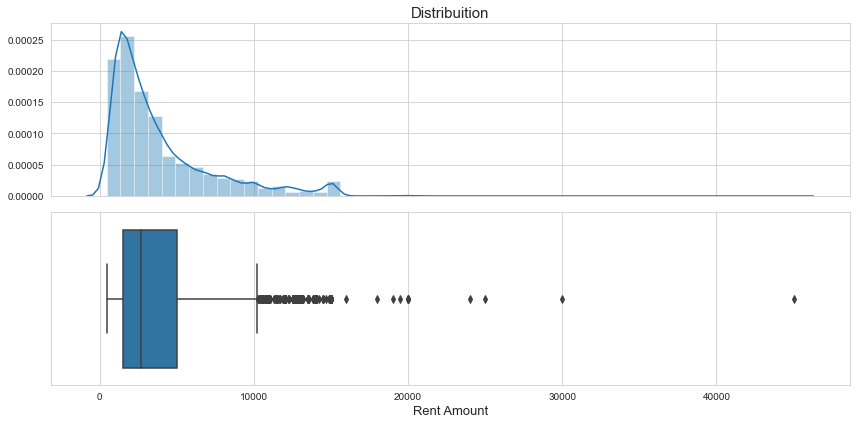

In [16]:
distbox(df_clean['rent_amount'])

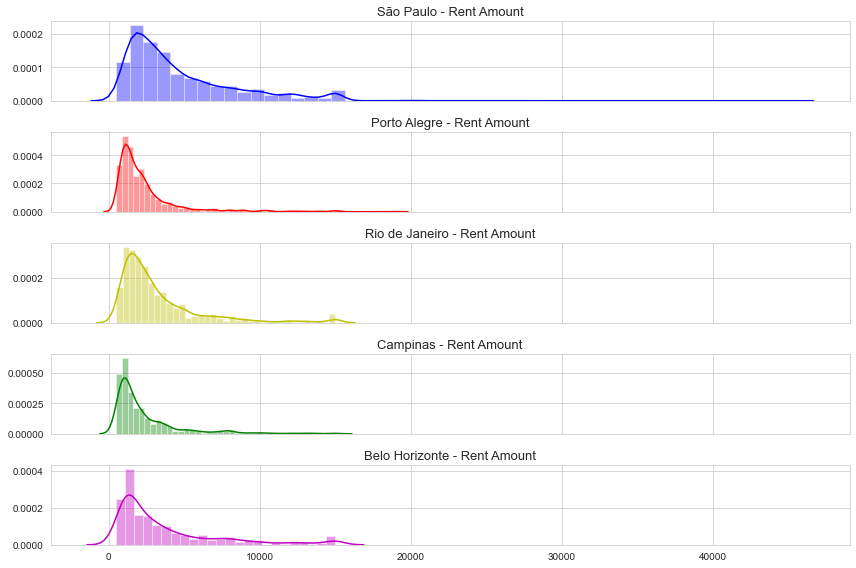

In [17]:
fig, axes = plt.subplots(df_clean['city'].nunique(), 1, sharex=True, figsize=(12, 8))

i = 0
color = ['b', 'r', 'y', 'g', 'm']

for city in df_clean['city'].unique():
    sns.distplot(df_clean[df_clean['city'] == city]['rent_amount'], color=color[i], ax=axes[i])
    
    axes[i].set_title(city + ' - Rent Amount', fontsize=13)
    axes[i].set_xlabel('')
    
    i += 1
    
plt.tight_layout()

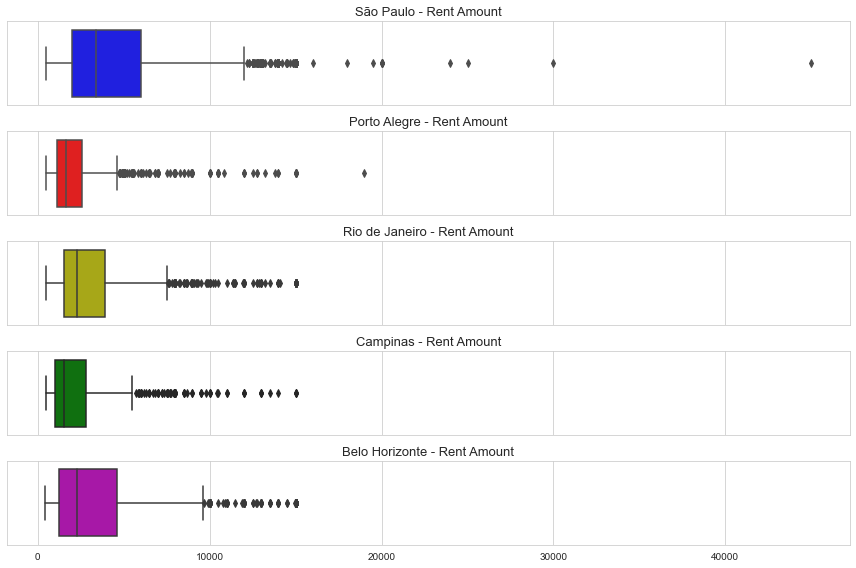

In [18]:
fig, axes = plt.subplots(df_clean['city'].nunique(), 1, sharex=True, figsize=(12, 8))

i = 0
color = ['b', 'r', 'y', 'g', 'm']

for city in df_clean['city'].unique():
    sns.boxplot(df_clean[df_clean['city'] == city]['rent_amount'], color=color[i], ax=axes[i])
    
    axes[i].set_title(city + ' - Rent Amount', fontsize=13)
    axes[i].set_xlabel('')
    
    i += 1
    
plt.tight_layout()

<br/><br/>

Analysing correlation between variables and checking the features that most influence our target.
<br/><br/>

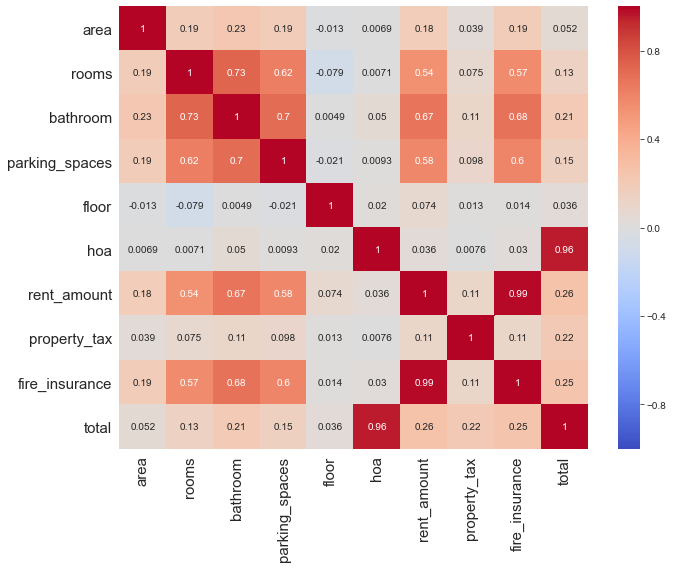

In [19]:
plt.figure(figsize=(10,8))

sns.heatmap(df_clean.corr(), annot=True, vmin=-1, vmax=1, cmap='coolwarm')

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)

plt.tight_layout()

In [20]:
# We will assume a correlation equal to or greater than 0.5 as influential
df_clean.corr()[df_clean.corr()['rent_amount'] >= 0.5]['rent_amount'].round(3)

rooms             0.542
bathroom          0.669
parking_spaces    0.578
rent_amount       1.000
fire_insurance    0.987
Name: rent_amount, dtype: float64

<br/><br/>

Removing correlation from itself, there are four features with influential correlations with the rent amount: rooms, bathroom, parking spaces and fire insurance. Plotting those features to visualize their distribution.
<br/><br/>

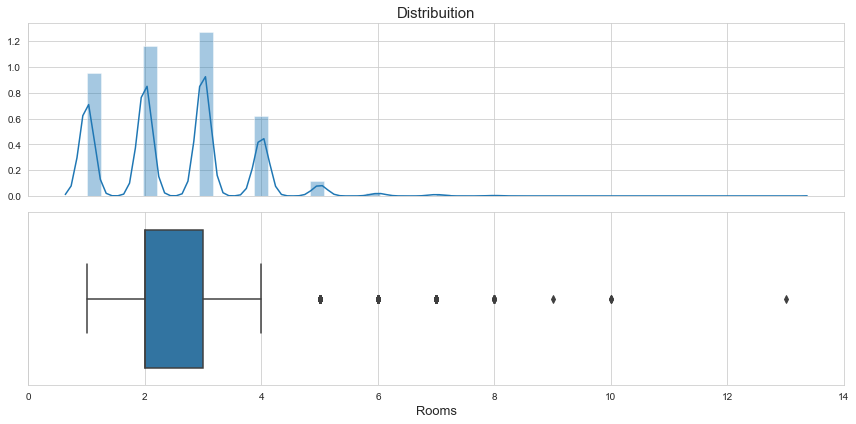

In [21]:
distbox(df_clean['rooms'])

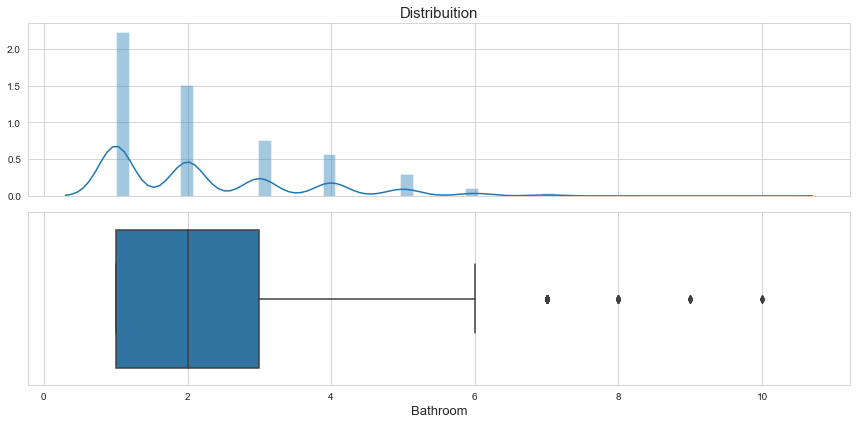

In [22]:
distbox(df_clean['bathroom'])

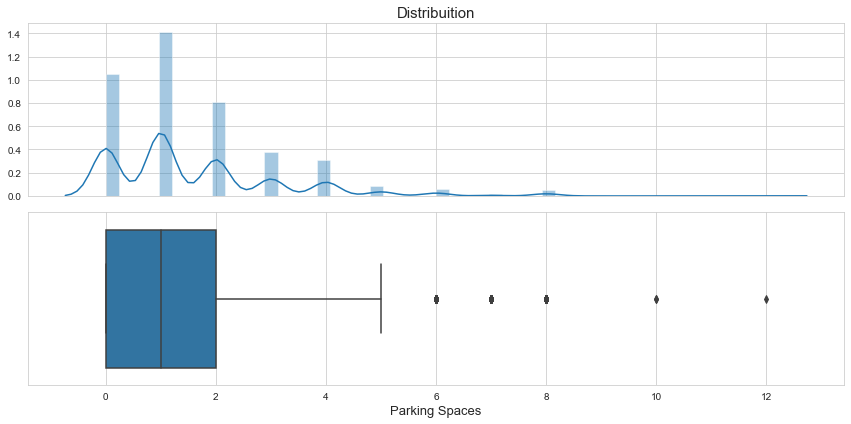

In [23]:
distbox(df_clean['parking_spaces'])

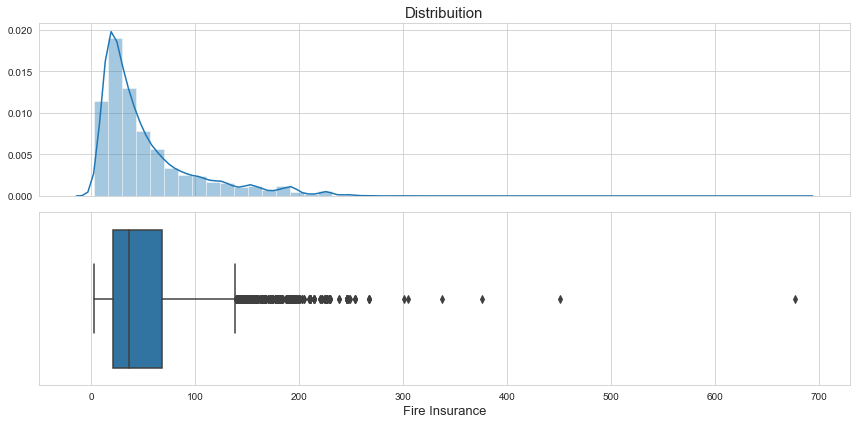

In [24]:
distbox(df_clean['fire_insurance'])

<br/><br/>

Fire insurance has the highest correlation, almost perfect.
<br/><br/>

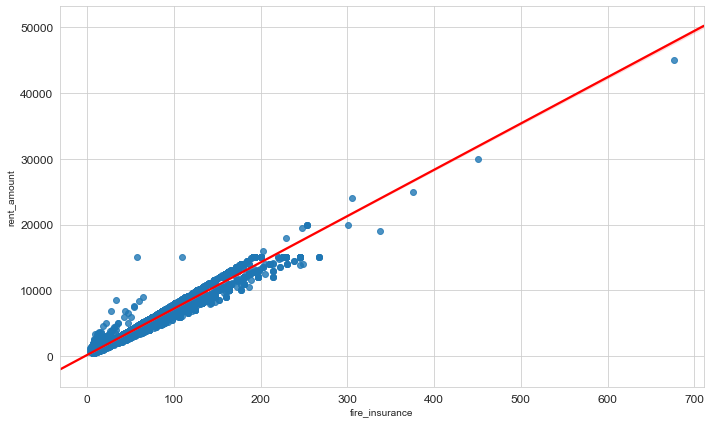

In [25]:
plt.figure(figsize=(10,6))

sns.regplot(x='fire_insurance', y='rent_amount', data=df_clean,
            line_kws={'color':'r'})

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()

<br/><br/>

Plotting the least influential features.
<br/><br/>

In [26]:
df_clean.head()

,city,area,rooms,bathroom,parking_spaces,floor,animal,furniture,hoa,rent_amount,property_tax,fire_insurance,total
0,São Paulo,70,2,1,1,7,acept,furnished,2065,3300,211,42,5618
1,São Paulo,320,4,4,0,20,acept,not furnished,1200,4960,1750,63,7973
2,Porto Alegre,80,1,1,1,6,acept,not furnished,1000,2800,0,41,3841
3,Porto Alegre,51,2,1,0,2,acept,not furnished,270,1112,22,17,1421
4,São Paulo,25,1,1,0,1,not acept,not furnished,0,800,25,11,836


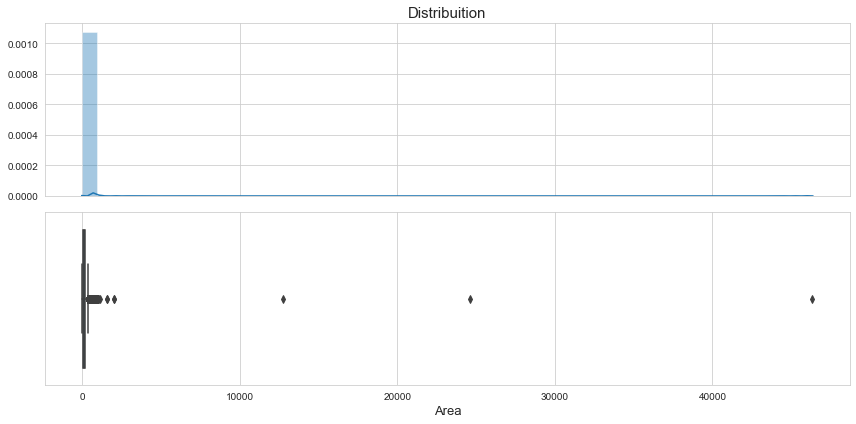

In [27]:
distbox(df_clean['area'])

In [28]:
# Defining outliers
outliers(df_clean['area'])

(-133.0, 371.0)

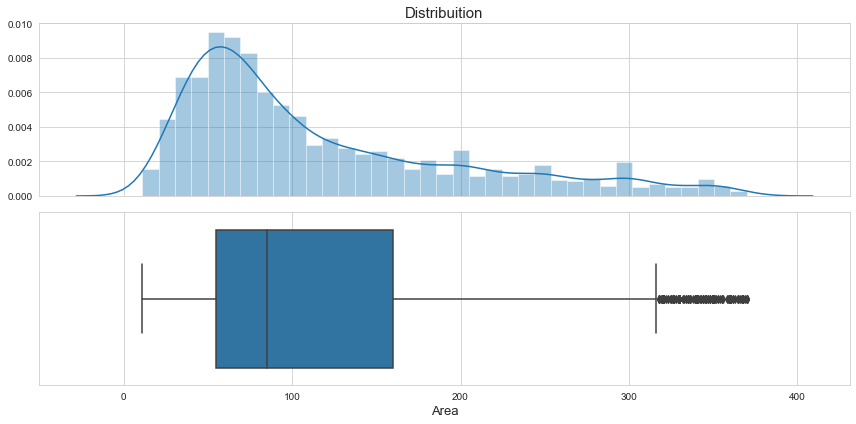

In [29]:
# Removing outliers from the chart
distbox(df_clean[df_clean['area'] < 371.0]['area'])

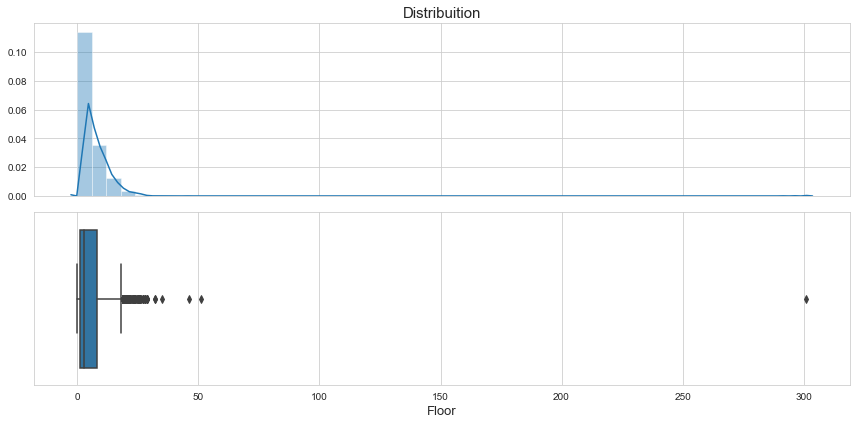

In [30]:
distbox(df_clean['floor'])

In [31]:
df_clean['floor'].max()

301

In [32]:
# 301 represents the apartment number from third floor
df_clean.loc[df_clean['floor'] == 301, 'floor'] = 3

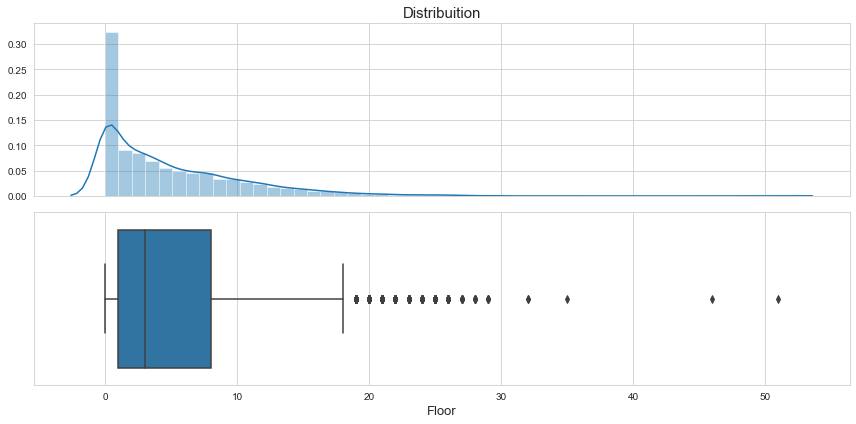

In [33]:
distbox(df_clean['floor'])

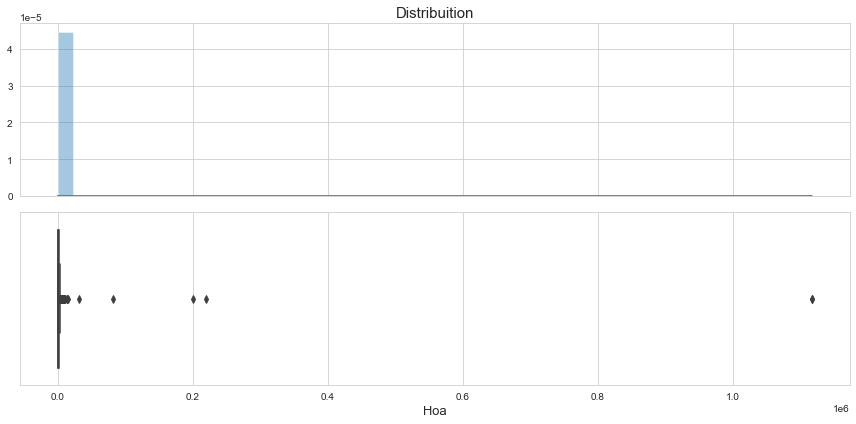

In [34]:
distbox(df_clean['hoa'])

In [35]:
df_clean['hoa'].sort_values(ascending=False)[:10]

255     1117000
6979    1117000
6230     220000
2859     200000
2928      81150
1444      32000
1213      15000
415       14130
5293      14000
8858      10000
Name: hoa, dtype: int64

In [36]:
# Defining outliers
outliers(df_clean['hoa'])

(-1432.0, 2840.0)

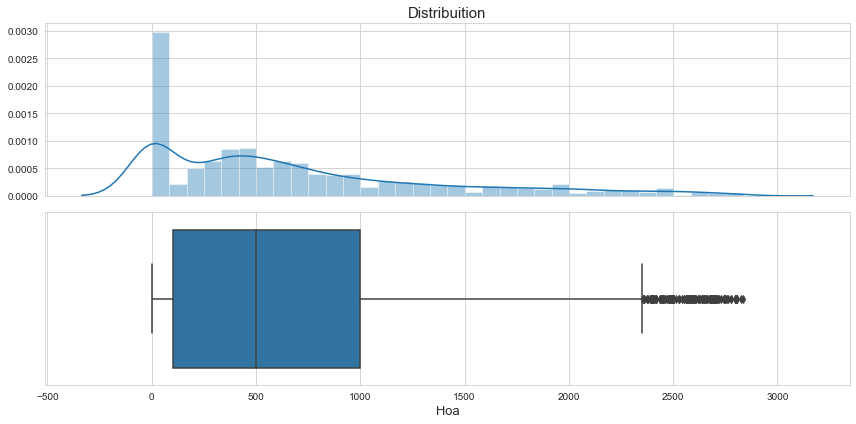

In [37]:
# Removing outliers from the chart
distbox(df_clean[df_clean['hoa'] < 2840.0]['hoa'])

In [38]:
df_clean.loc[df_clean['hoa'].sort_values(ascending=False)[:6].index]

,city,area,rooms,bathroom,parking_spaces,floor,animal,furniture,hoa,rent_amount,property_tax,fire_insurance,total
255,Belo Horizonte,155,1,4,0,4,not acept,not furnished,1117000,2790,64,38,1120000
6979,Belo Horizonte,155,1,4,0,4,not acept,not furnished,1117000,2790,64,38,1120000
6230,São Paulo,340,5,4,2,7,acept,not furnished,220000,12000,1000,153,233200
2859,São Paulo,285,4,5,4,6,acept,furnished,200000,20000,1834,254,222100
2928,Rio de Janeiro,35,1,1,0,1,acept,furnished,81150,4500,9900,58,95610
1444,Porto Alegre,42,1,1,0,10,acept,not furnished,32000,700,40,11,32750


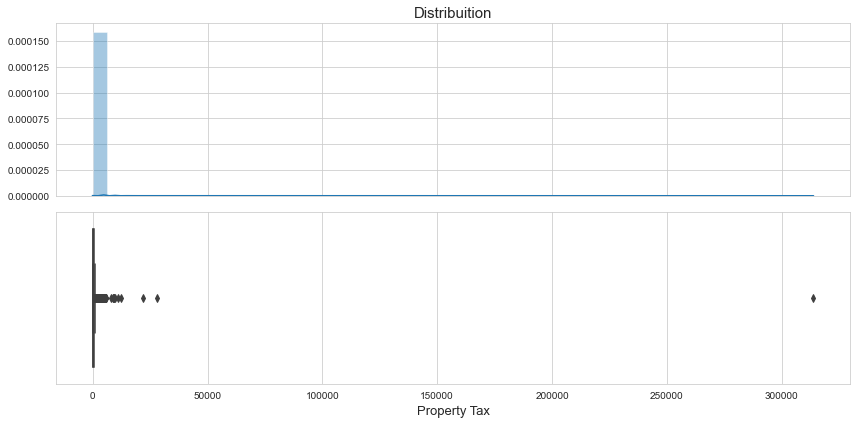

In [39]:
distbox(df_clean['property_tax'])

In [40]:
# Defining outliers
outliers(df_clean['property_tax'])

(-467.5, 880.5)

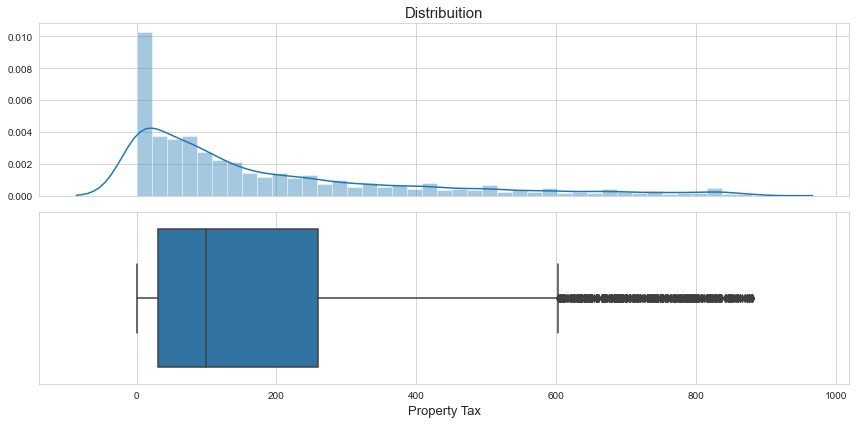

In [41]:
# Removing outliers from the chart
distbox(df_clean[df_clean['property_tax'] < 880.5]['property_tax'])

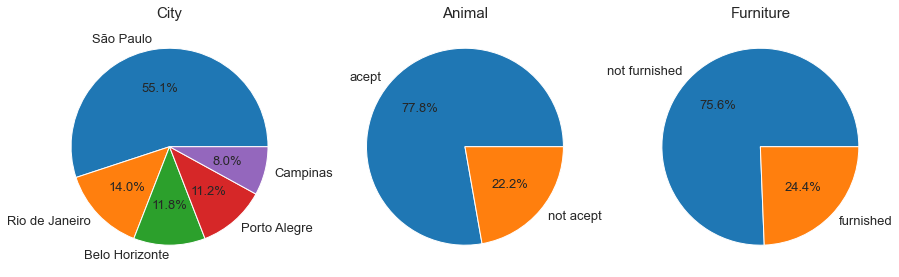

In [42]:
fig, axes = plt.subplots(1, 3, figsize=(15, 8))

i = 0

for col in ['city', 'animal', 'furniture']:
    
    axes[i].set_title(df_clean[col].name.title(), fontsize=15)
    
    axes[i].pie(df_clean[col].value_counts(),
            labels=df_clean[col].value_counts().index,
            textprops = {"fontsize":13},
            autopct='%1.1f%%');
    
    i += 1

Text(0.5, 0, 'Furniture')

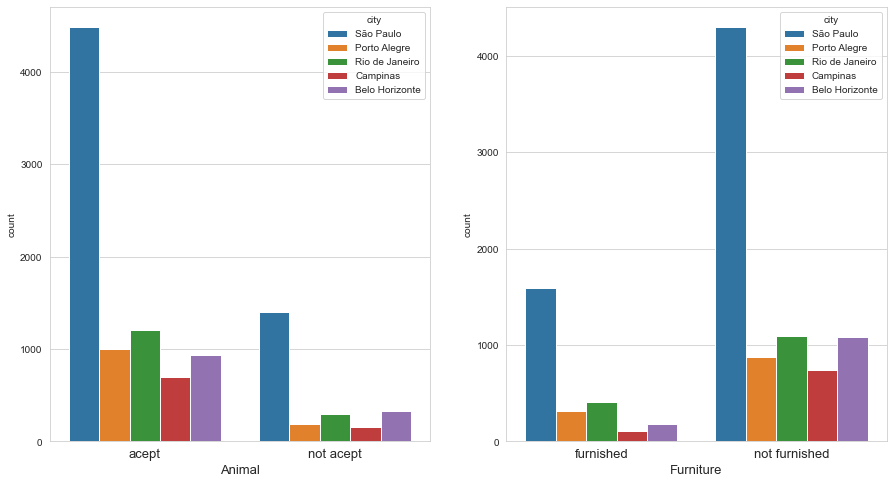

In [43]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8))

sns.countplot(x='animal', data=df_clean, hue='city', ax=axes[0])

axes[0].tick_params(axis="x", labelsize=13)
axes[0].set_xlabel('Animal', fontsize=13)

sns.countplot(x='furniture', data=df_clean, hue='city', ax=axes[1])

axes[1].tick_params(axis="x", labelsize=13)
axes[1].set_xlabel('Furniture', fontsize=13)

## 3) Forecasting Rent Amount

In [46]:
X = df_clean.drop(columns='rent_amount', axis=1)
y = df_clean['rent_amount']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [80]:
def scalerApply(model):

    """

    Apply the chosen model using 4 differents scalers/transformations:
        MinMaxScaler
        StandardScaler
        RobustScaler
        PowerTransformer

    Returns 3 plots and the score:
        Actual values x Predicted values
        Residual values (actual - predicted)
        Actual distribution x Predicted distribution

    """

    scalers = [MinMaxScaler(), StandardScaler(), RobustScaler(), PowerTransformer()]

    for scaler in scalers:
        num_transformer = Pipeline(steps=[('scaler', scaler),
                                          ('imputer', SimpleImputer(strategy='median'))
                                         ])

        cat_transformer = Pipeline(steps=[('one-hot_encoder', OneHotEncoder(drop='first'))
                                         ])

        num_cols = X.dtypes[df_clean.dtypes!='object'].index

        cat_cols = X.dtypes[df_clean.dtypes=='object'].index

        preprocessor =  ColumnTransformer(transformers=[("num_pipeline", num_transformer, num_cols),
                                                        ("cat_pipeline", cat_transformer, cat_cols),
                                                       ])

        model_pipe = Pipeline(steps=[('preprocessor', preprocessor),
                                     ('model', model)
                                    ])

        model_pipe.fit(X_train,y_train);

        prediction = model_pipe.predict(X_test);

        fig, axes = plt.subplots(1, 3, figsize=(16, 4))

        sns.scatterplot(y_test, prediction, ax=axes[0]);
        axes[0].set_title('Model Linearity');

        # Residual Histogram
        sns.distplot((y_test-prediction),bins=50, ax=axes[1]);
        axes[1].set_title('Model Residue');

        sns.distplot(y_test, hist=False, color='b', label ='Actual', ax=axes[2]);
        sns.distplot(prediction, hist=False, color='r', label = 'Predicted', ax=axes[2]);
        axes[2].set_title('Model Accuracy');

        fig.suptitle(str(scaler).split(sep='(')[0], fontsize=16, y=1.1)

        plt.tight_layout()

### Linear Regression

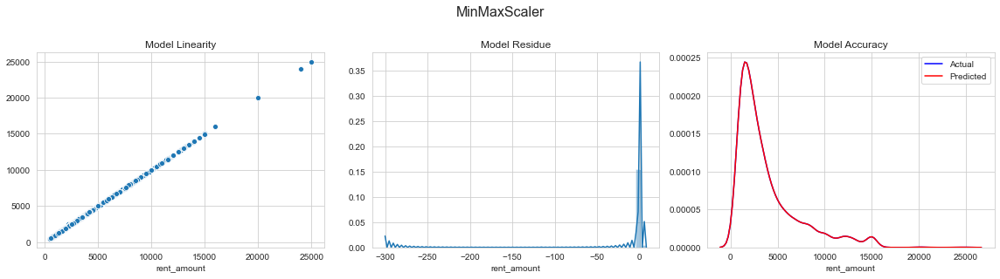

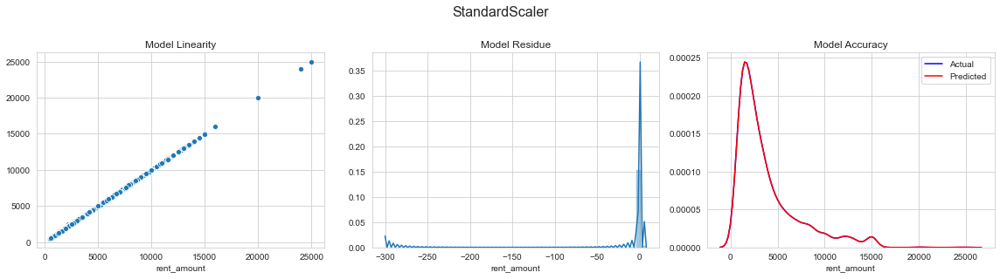

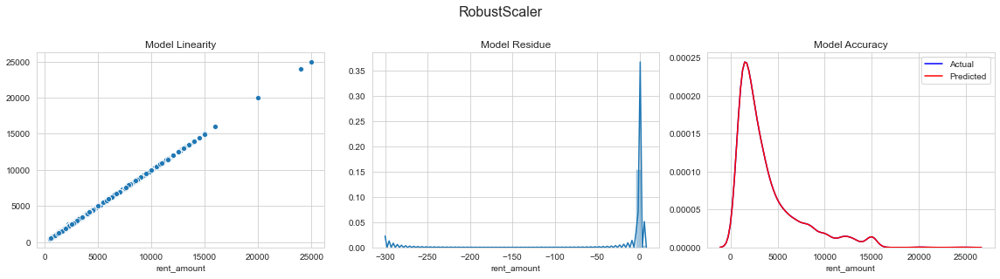

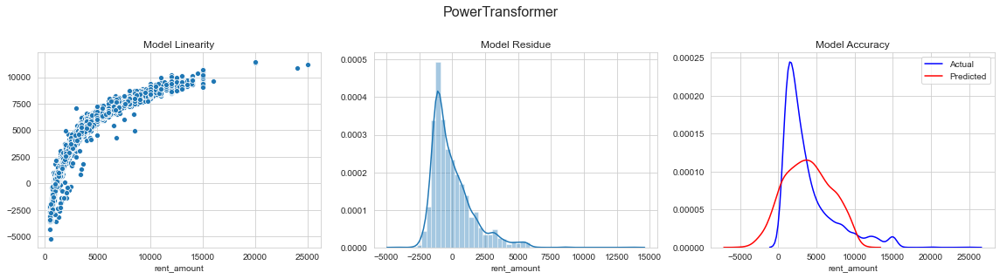

In [84]:
scalerApply(LinearRegression())

### Gradient Boosting Regressor

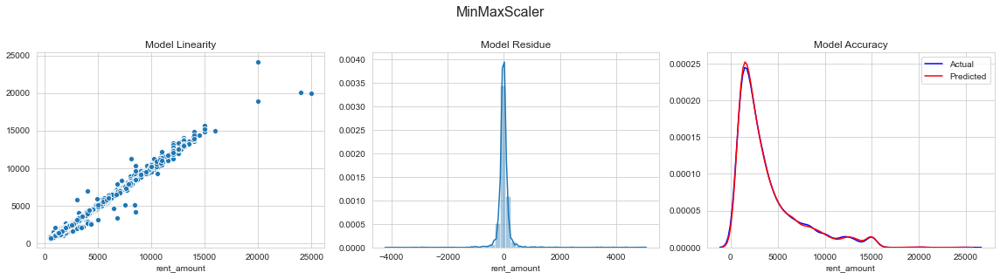

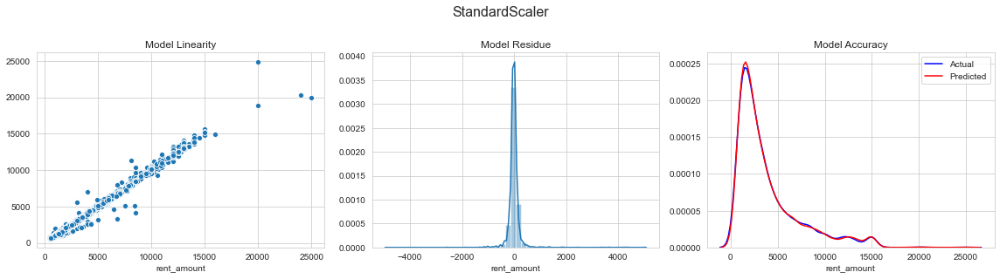

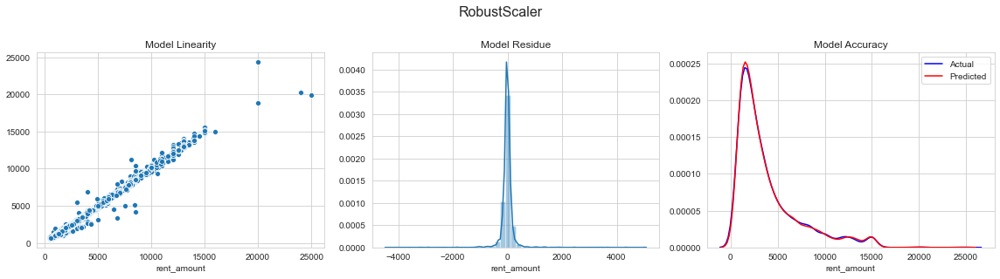

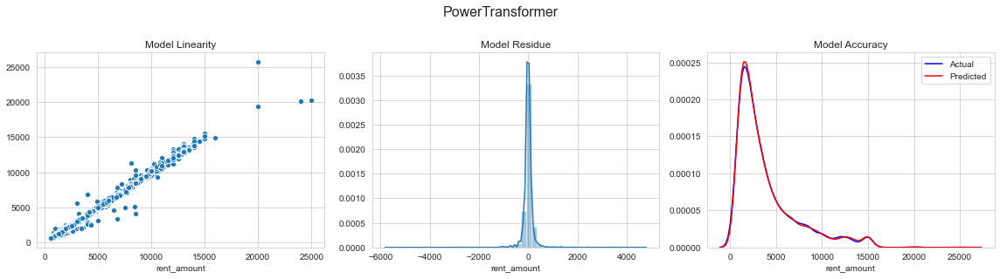

In [85]:
scalerApply(GradientBoostingRegressor())

### Decision Tree Regressor

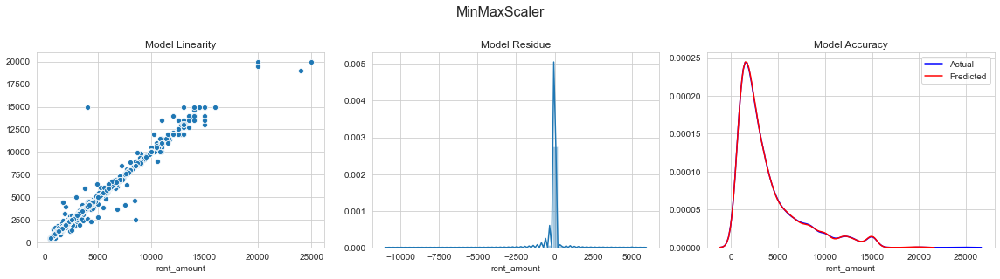

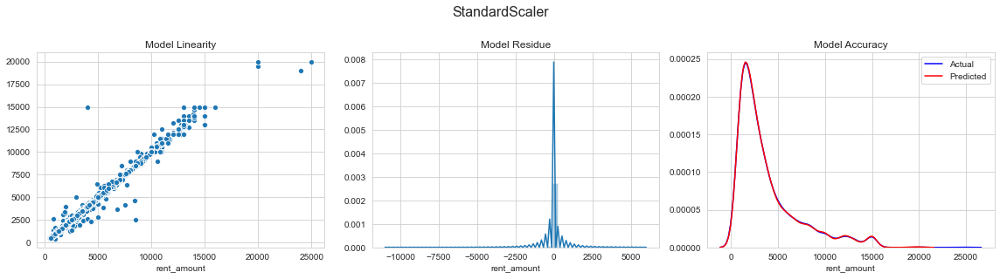

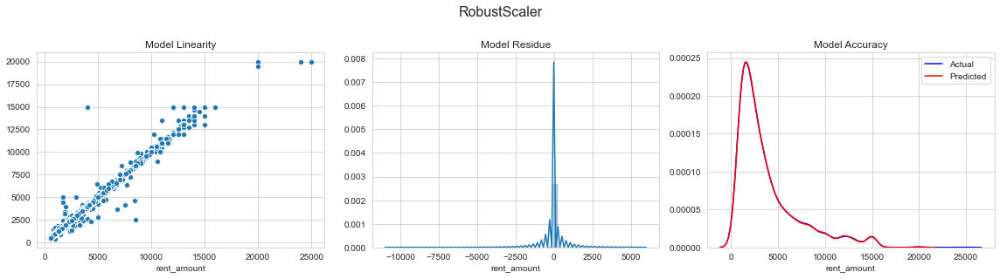

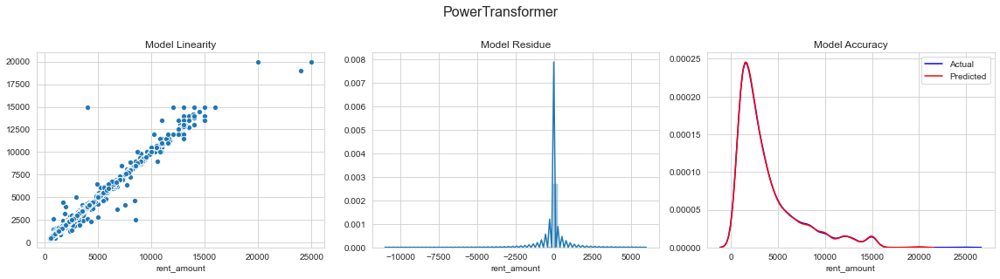

In [86]:
scalerApply(DecisionTreeRegressor())

### Random Forest Regressor

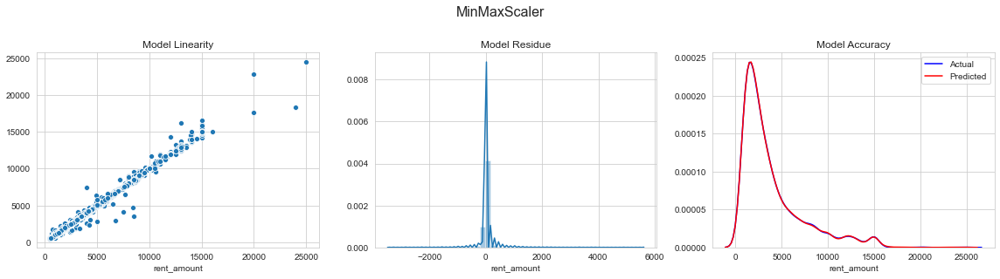

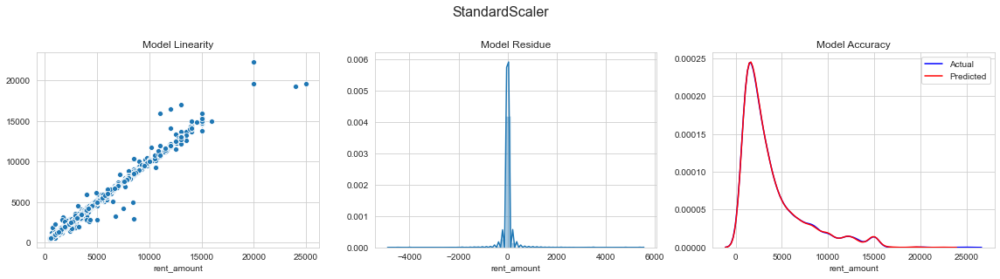

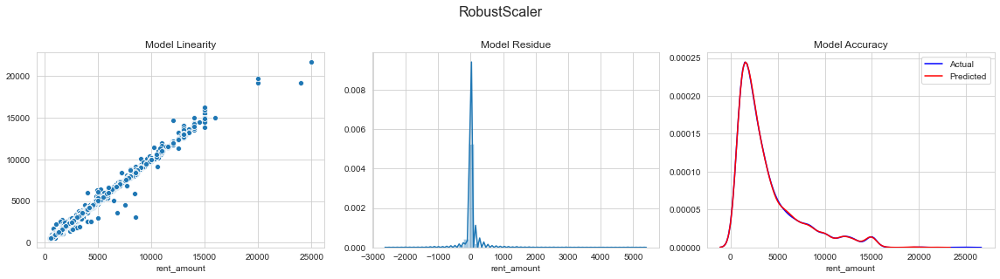

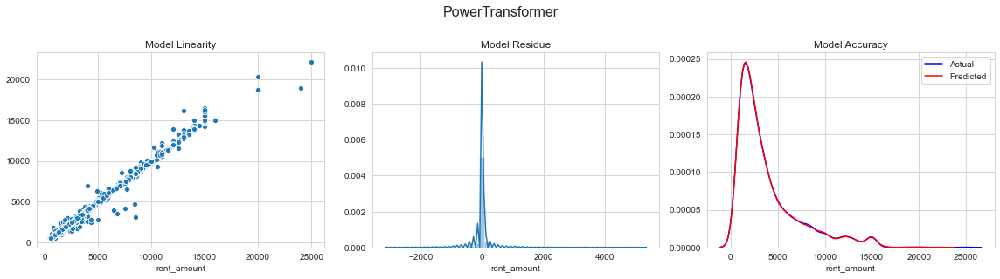

In [87]:
scalerApply(RandomForestRegressor())

### Cross Validating on Best Model

In [88]:
num_transformer = Pipeline(steps=[('scaler', RobustScaler()),
                                  ('imputer', SimpleImputer(strategy='median'))
                                 ])
    
cat_transformer = Pipeline(steps=[('one-hot_encoder', OneHotEncoder(drop='first'))
                                 ])
    
num_cols = X.dtypes[df_clean.dtypes!='object'].index
    
cat_cols = X.dtypes[df_clean.dtypes=='object'].index
    
preprocessor =  ColumnTransformer(transformers=[("num_pipeline", num_transformer, num_cols),
                                                ("cat_pipeline", cat_transformer, cat_cols),
                                               ])
    
model_pipe = Pipeline(steps=[('preprocessor', preprocessor),
                             ('model', LinearRegression())
                            ]);

scoring = ('r2', 'neg_mean_absolute_error', 'neg_mean_squared_error')

cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=101)

scores = cross_validate(model_pipe, X, y, scoring=scoring, cv=cv, n_jobs=-1)

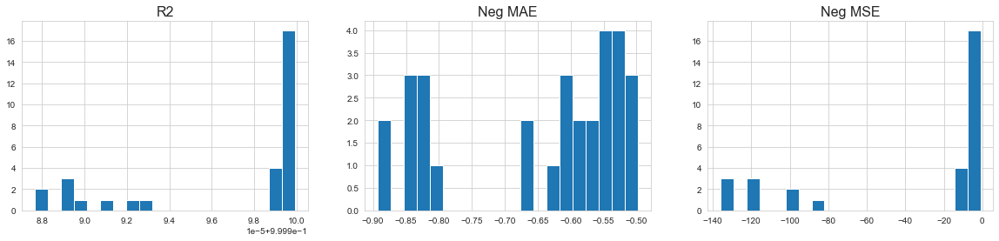

In [89]:
fig, axes = fig, axes = plt.subplots(1, 3, figsize=(20, 4))

axes[0].hist(scores['test_r2'], bins=20);
axes[0].set_title('R2', fontsize=16);

axes[1].hist(scores['test_neg_mean_absolute_error'], bins=20);
axes[1].set_title('Neg MAE', fontsize=16);

axes[2].hist(scores['test_neg_mean_squared_error'], bins=20);
axes[2].set_title('Neg MSE', fontsize=16);

In [90]:
print('R2: {:.3f}'.format(np.mean(scores['test_r2'])))
print('Neg MAE: {:.3f}'.format(np.mean(scores['test_neg_mean_absolute_error'])))
print('Neg MSE: {:.3f}'.format(np.mean(scores['test_neg_mean_squared_error'])))

R2: 1.000
Neg MAE: -0.652
Neg MSE: -37.410
